# Part A: Template Matching with OpenCV

## Template Matching: 
Template matching is a technique in computer vision used to find the location of a smaller image (template) within a larger image by sliding the template over the image and comparing pixel values.

<img src="assets/template_matching.png" alt="Template Matching Example" width="500"/>

## OpenCV:
OpenCV is an open-source computer vision library that provides tools for image processing, object detection, and machine learning.

In [1]:
# Imports
import cv2 
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import utility as U
import numpy as np
from tqdm import tqdm
from math import tan

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## 🔹 Task 1.1: Load the Left Frame and Create a Template
Start by loading the left image from the stereo pair. Then, select and crop a 50×50 pixel region from it to serve as your template. This cropped region will be used for matching in later steps.

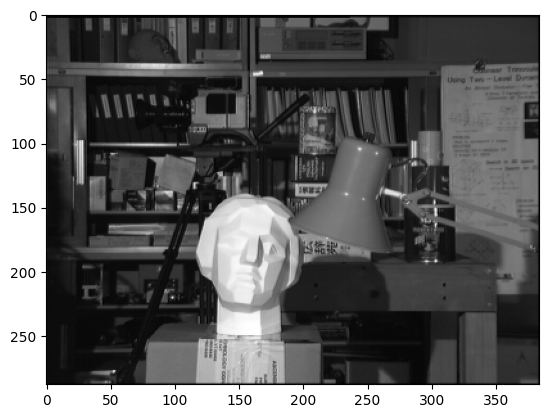

Image Shape:  (288, 384)


In [2]:
# Load the left image in grayscale
img = cv2.imread("sample_data/left.ppm", cv2.IMREAD_GRAYSCALE)

# Display the image
plt.imshow(img, cmap='gray')
plt.show()

# Print image dimensions
print("Image Shape: ", img.shape)

Template Shape:  (50, 50)


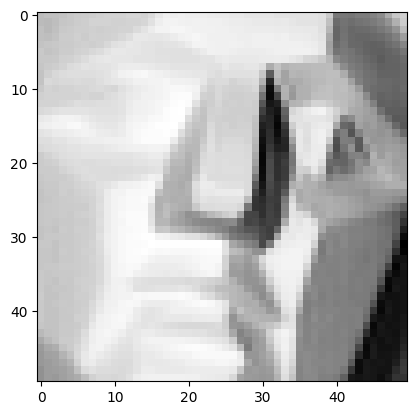

In [3]:
# Use the following parameters to define the template region.
template_row_start = 165
template_col_start = 135
block_size = 50

# ----- My Code -----
template_row_end = template_row_start + block_size
template_col_end = template_col_start + block_size
template = img[
    template_row_start:template_row_end,
    template_col_start:template_col_end
]

print("Template Shape: ", template.shape)
plt.imshow(template, cmap='gray')
plt.show()

## 🔹 Task 1.2: Locate the template position in the left frame

Use template matching to locate the position of the template within the original image and visualize the detected area.

### 🔍 Hints

1. OpenCV provides the `cv2.matchTemplate()` function, which slides the template across the image and computes a **distance (or similarity) score** at each location. In this example, we will use the **squared difference** method (`cv2.TM_SQDIFF`).\
The result is a **heatmap** of distance values, where each value represents the difference between the template and a corresponding patch in the image (defined by its top-left corner).\
    📝 Note: Since the template cannot slide over the borders, the size of the heatmap is smaller than the original image.

2. Use `cv2.minMaxLoc()` to find the location of the minimum value in the heatmap, which corresponds to the best match.

3. Visualize the result by drawing a rectangle around the matched region on the original image.

### 📄 Documentation

- `cv2.matchTemplate(image, templ, method)`\
→ Slides the template across the image and returns a heatmap of similarity scores using the given method (e.g., cv2.TM_SQDIFF).

- `cv2.minMaxLoc(src)`\
→  Returns the minimum and maximum values in an array, along with their locations. When using TM_SQDIFF, the minimum location gives the best match.


Heatmap shape: (239, 335)


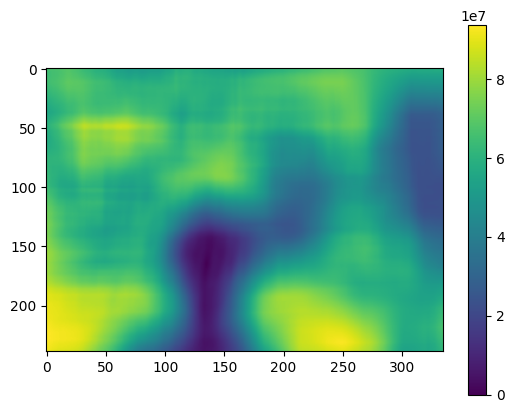

In [4]:
# 1.2.1 : Perform template matching using squared difference method and visualize the heatmap
res = cv2.matchTemplate(img, template, cv2.TM_SQDIFF) # My Code

# Display the resulting heatmap
print("Heatmap shape:", res.shape)
plt.imshow(res)
plt.colorbar()
plt.show()

In [5]:
# 1.2.2 : Find the location of the best match
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res) # My Code

# Display result coordinates
print(f"Rectangle starts at row: {min_loc[1]}, column: {min_loc[0]}")

Rectangle starts at row: 165, column: 135


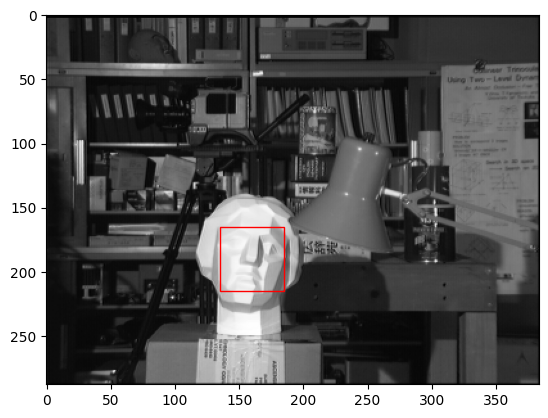

In [6]:
# 1.2.3 : Visualize a rectangle over the selected area

# Get template dimensions
template_rows, template_cols = template.shape

# Display the original image
plt.imshow(img, cmap='gray')

# Get the current reference (to access the display image and overlap the rectangle)
ax = plt.gca()

# Create the rectangle
rect = Rectangle(min_loc, template_cols, template_rows, linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(rect)

plt.show()

📝 Note: Since we've manually implemented the visualization of the rectangle above, for the rest of the lab we will use the helper function U.disp_image_and_rectangle() from utility.py to simplify our code and keep it clean.

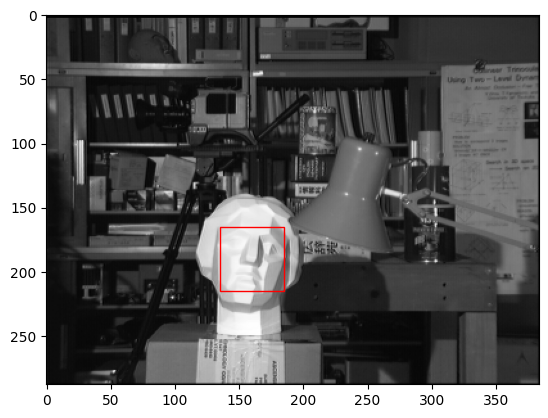

In [7]:
U.disp_image_and_rectangle(img, min_loc, template_rows, template_cols)

## 🔹 Task 1.3: Locate the Template in the Right Frame

To visualize the left and right frames side by side, you can use the visualize_stereo_frames() function from utility.py.

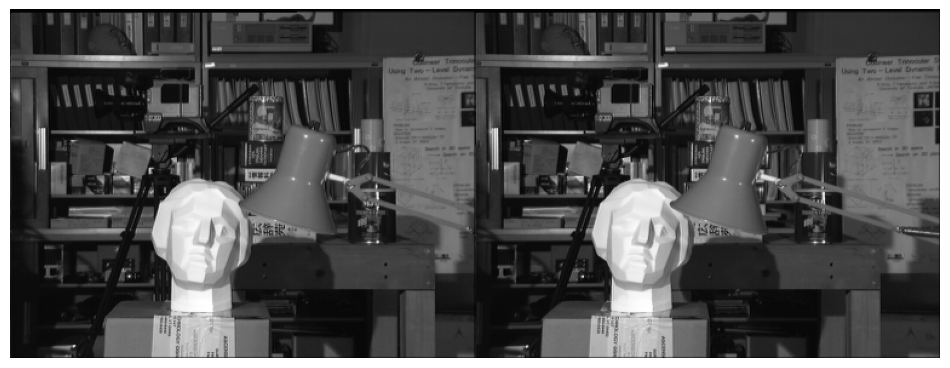

In [8]:
# Load the image
right_img = cv2.imread("sample_data/right.ppm", cv2.IMREAD_GRAYSCALE)
U.visualize_stereo_frames(img, right_img)

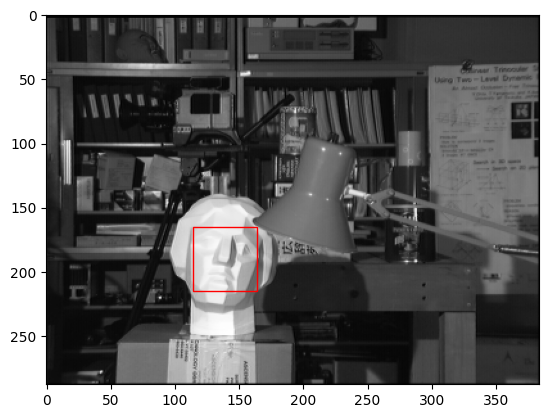

In [9]:
# Do the template matching
res = cv2.matchTemplate(right_img, template, cv2.TM_SQDIFF) # My Code

# Get the minimum distance position
_, _, min_loc_right, _ = cv2.minMaxLoc(res) # My Code

# Visualize the rectangle
U.disp_image_and_rectangle(right_img, min_loc_right, template_rows, template_cols)

### Print the row that the template was found on, in the right frame. What do you observe?


In [10]:
print("Row of the template in the left image : ", template_row_start)
print("Row of the template in the right image : ", min_loc_right[1])

Row of the template in the left image :  165
Row of the template in the right image :  165


## 🔹 Task 1.4: Narrow Down the Region of Interest (RoI)
In this task, we will restrict the search area in the right image to improve performance and accuracy.

Since the stereo cameras are mounted at the same horizontal level, corresponding points between the two images appear on the same row.

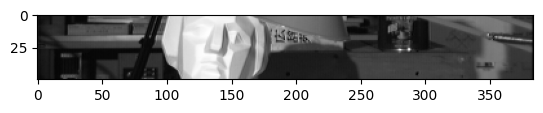

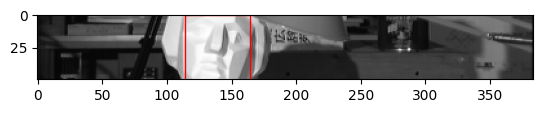

In [11]:
# Crop the right image so that we only search the rows of interest
right_img_crop =  right_img[template_row_start:template_row_start + block_size, :] # My Code
plt.imshow(right_img_crop, cmap="gray")
plt.show()

# Do the template matching
res = cv2.matchTemplate(right_img_crop, template, cv2.TM_SQDIFF)
# Get the minimum distance position
_, _, min_loc_right_crop, _ = cv2.minMaxLoc(res)
# Visualize the rectangle
U.disp_image_and_rectangle(right_img_crop, min_loc_right_crop, template_rows, template_cols)

## 🔹 Task 1.5: Narrow the Search Even More
We can further reduce the search area based on the geometry of the stereo setup.

Since we are now matching the template in the right frame, and the cameras are horizontally aligned, the matching region in the right image will appear to the left of its original position in the left image.

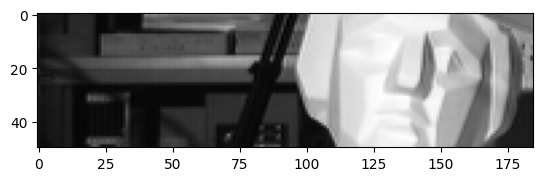

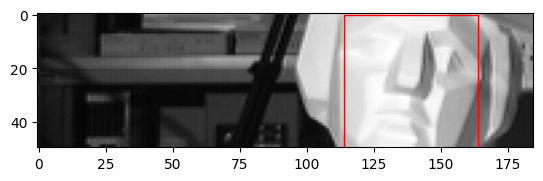

In [12]:
# Make a new crop of the image (should contain the coordinates of the template)
right_img_crop_crop = right_img_crop[:, :template_col_start + block_size] # My Code

plt.imshow(right_img_crop_crop, cmap='gray')
plt.show()

# Do the template matching
res = cv2.matchTemplate(right_img_crop_crop, template, cv2.TM_SQDIFF)
# Get the minimum distance position
_, _, min_loc_right_crop_crop, _ = cv2.minMaxLoc(res)
# Visualize the rectangle
U.disp_image_and_rectangle(right_img_crop_crop, min_loc_right_crop_crop, template_rows, template_cols)

**Live Add-On during lab**

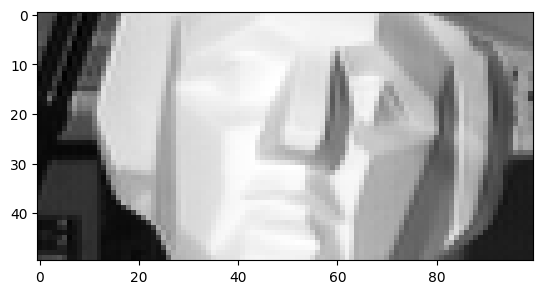

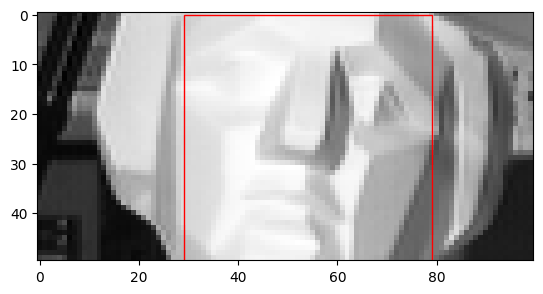

In [13]:
# Make a new crop of the image (should contain the coordinates of the template)
temp_max_num_blocks = 1
temp_start = max(0, template_col_start - temp_max_num_blocks * block_size)
right_img_crop_crop = right_img_crop[:, temp_start:template_col_start + block_size] # My Code

plt.imshow(right_img_crop_crop, cmap='gray')
plt.show()

# Do the template matching
res = cv2.matchTemplate(right_img_crop_crop, template, cv2.TM_SQDIFF)
# Get the minimum distance position
_, _, min_loc_right_crop_crop, _ = cv2.minMaxLoc(res)
# Visualize the rectangle
U.disp_image_and_rectangle(right_img_crop_crop, min_loc_right_crop_crop, template_rows, template_cols)

## 🔹 Task 1.6: Disparity Calculation
Now that we've identified the matching template positions in both the left and right images, we can compute the disparity.

#### 🎯 What is Disparity?
Disparity is the horizontal distance between the position of a point in the left image and its corresponding point in the right image. It is a key component in stereo vision and directly related to depth—closer objects have larger disparities, while farther objects have smaller disparities.

In [14]:
disparity = template_col_start - min_loc_right[0] # My Code
print(f"The disparity value is {disparity}") 

The disparity value is 21


# 🔸 Part B: Disparity Extraction from Stereo Images

To compute the disparity map, we will repeat the same template matching process used earlier—this time for each pixel (or patch) in the left image.

Since we use a fixed-size template, we cannot compute disparity near the image borders, where the template would extend beyond the frame. Therefore, we will exclude marginal pixels (e.g., bottom rows and rightmost columns) from the computation.

In the next cell, we'll reload and visualize the stereo image frames to start this step with a clean setup.


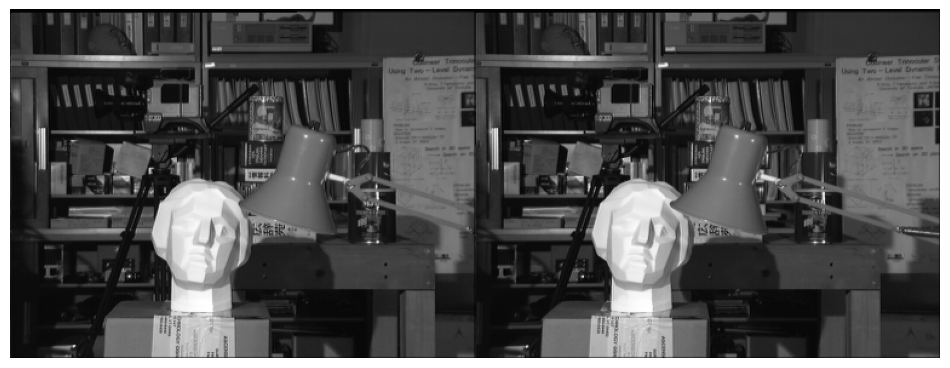

In [15]:
# Setting paths
datapath = "./sample_data/"
left_frame_path = datapath + "left.ppm"
right_frame_path = datapath + "right.ppm"
disparity_path = datapath + "truedisp.pgm"


# Loading the two frames again (both greyscale -> disparity and color version -> visualization)
left_frame = cv2.imread(left_frame_path, cv2.IMREAD_GRAYSCALE)
left_frame_color = cv2.imread(left_frame_path)
right_frame = cv2.imread(right_frame_path, cv2.IMREAD_GRAYSCALE)
right_frame_color = cv2.imread(right_frame_path)

U.visualize_stereo_frames(left_frame, right_frame)

## 🔸 Task 2.1: Compute the Disparity Map Using Block Matching

🧩 Overview:
- For each pixel in the left image, we extract a square block (template) of fixed size.

- We then search along the same row in the right image to find the best match for that block.

- The horizontal distance between the block’s position in the left image and its best match in the right image is the disparity.

- The disparity value is stored in the corresponding location of the disparity_map.

100%|████████████████████████████████████████████████████████████████████████████████| 280/280 [00:08<00:00, 32.48it/s]


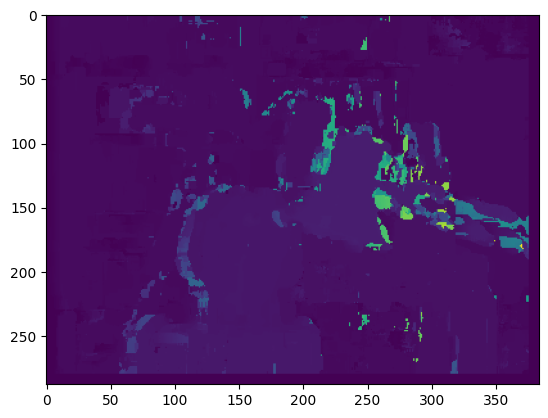

In [16]:
# setting the block size
block_size = 8

frame_shape = left_frame.shape # [288, 384]

# Create an image to store the disparity
disparity_map = np.zeros_like(left_frame, dtype=int)


# Parse the pixels - Use tqdm to monitor the process. 
for i in tqdm(range(frame_shape[0] - block_size)):
    
    for j in range(frame_shape[1] - block_size):
        
        # TODO ... 

        # Calculate the template
        temp = left_frame[i:i + block_size, j:j + block_size]
        
        # Extract the ROI from the right frame
        ROI = right_frame[i:i + block_size, :j + block_size]

        # Do the block matching
        res = cv2.matchTemplate(ROI, temp, cv2.TM_SQDIFF)

        # Locate the coordinates of the best match
        (_, _, min_loc, _) = cv2.minMaxLoc(res)

        # Calculate the disparity value
        disparity = j - min_loc[0]
         
        # Save the disparity value in the map
        disparity_map[i, j] = disparity


plt.imshow(disparity_map)
plt.show()

## 🔸 Task 2.2: Disparity Map with Bounded Search Range
In this step, we optimize the disparity computation by limiting how far we search to the left in the right image.

Instead of scanning the entire row, we now restrict the search to a fixed number of blocks to the left of each pixel. This reduces the number of comparisons, speeds up the algorithm, and reflects a realistic constraint based on a known or estimated maximum disparity.

100%|████████████████████████████████████████████████████████████████████████████████| 280/280 [00:04<00:00, 66.69it/s]


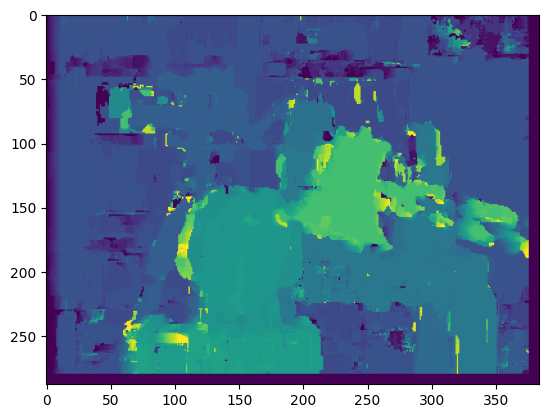

In [17]:
# Create an image to store the disparity
disparity_map = np.zeros_like(left_frame)
max_num_blocks = 5

# Parse the pixels
for i in tqdm(range(frame_shape[0] - block_size)):
    for j in range(frame_shape[1] - block_size):

        template = left_frame[i:i+block_size, j:j+block_size]

        # ----- My Code -----
        start = max(0, j - max_num_blocks * block_size)
        end = j + block_size

        roi = right_frame[i: i + block_size, start : end]

        res = cv2.matchTemplate(roi, template, cv2.TM_SQDIFF)

        _, _, min_loc, _ = cv2.minMaxLoc(res)

        disparity = j - (min_loc[0] + start) # Πρέπει να ξαναπροσθέσουμε αυτό που κόψαμε!

        disparity_map[i, j] = disparity


plt.imshow(disparity_map)
plt.show()

## 🔸 Task 2.3: Use OpenCV’s Block Matching to Calculate Disparity
In this step, we’ll replace our manual implementation with OpenCV’s built-in block matching algorithm to compute the disparity map more efficiently.

OpenCV provides the StereoBM_create() method, which performs block matching using optimized C++ code under the hood. It allows you to set parameters like block size and disparity range, giving you both speed and flexibility.

### ⚙️ Parameters to Note:
We must define a new hyperparameter: the number of disparities, which represents the maximum disparity shift to consider.

⚠️ This value must be a multiple of 16, as required by OpenCV.

The block size (also called window size) used for matching must be an odd number.



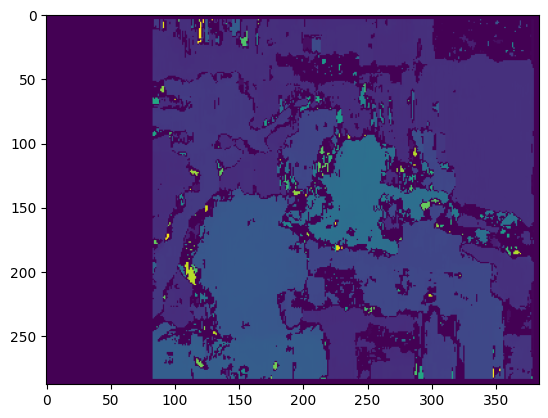

In [18]:
block_size = 9
num_disparities = 5 * 16

stereo = cv2.StereoBM_create(numDisparities=num_disparities, blockSize=block_size)
cv_disparity = stereo.compute(left_frame, right_frame)
plt.imshow(cv_disparity)
plt.show()

## 🔸 Task B.4: Load and Visualize the Ground Truth Disparity
To evaluate the accuracy of our disparity estimation, we will now load the ground truth disparity map provided with the dataset.

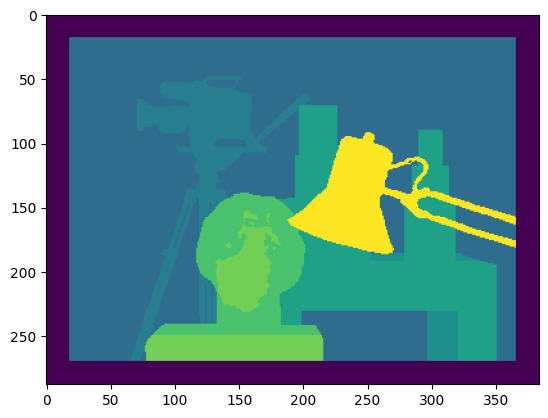

In [19]:
true_disparity = cv2.imread(disparity_path)[..., 0]
plt.imshow(true_disparity)
plt.show()

# 🔸 Part C: Point Cloud Reconstruction from Disparity Map
In this section, we will use the disparity map obtained from the stereo image pair to reconstruct a 3D point cloud. 

## 🔸 Task C.1: Compute the 3D Coordinates from the Disparity Map
To generate the point cloud, we will compute the 3D coordinates of each pixel with a valid disparity value using the pinhole camera model.

In [32]:
disparity_map = true_disparity
#disparity_map = cv_disparity

rows, columns = disparity_map.shape[0], disparity_map.shape[1]

# finding the center of the image
u0 = columns / 2 
v0 = rows / 2

# Constant parameters, depending on the camera parameters and position
stereo_baseline = 0.2
fieldOfView = 1.2
focal_length_constant = 1.0 / (2.0 * tan(fieldOfView / 2.0))


vertices = []
colors = []

for i in range(columns):
    for j in range(rows):

        # ----- My Code -----
        d = disparity_map[j, i] / columns

        color = left_frame_color[j, i]

        if d == 0:    # Σε περίπτωση που κάτι βρίσκεται
            continue; # σε απόσταση πάνω στην κάμερα!

        Z = focal_length_constant * stereo_baseline / d

        # Θέλουμε τώρα να κεντράρουμε το pcd!
        X = ((i - u0) / columns) * (Z / focal_length_constant)
        Y = ((j - v0) / rows) * (Z / focal_length_constant)

        if Z > 0: # Σε περίπτωση που βγει κ΄άποιο
                  # σημείο πίσω από την κάμερα
            vertices.append(np.array((40 * X, 40 * Y, 40 * Z)))
            colors.append(np.array(color) / 255.)
        
vertices = np.stack(vertices)
colors = np.stack(colors)

# U.visualize_point_cloud(vertices, colors)
U.visualize_pointcloud_plotly(vertices, colors)